In [1]:
import numpy as np
import scipy
import scipy.stats
import pandas as pd
import astropy.units as u
import sunpy.map
import sunpy.visualization.colormaps as cm
import sunpy.data.sample
import reproject
import cv2
from sklearn.cluster import KMeans
from PIL import Image
from copy import copy
import datetime
from IPython.display import Image

import cv2

import matplotlib.pyplot as plt
import matplotlib.colors as colors
import seaborn as sns
import seaborn_image as isns
sns.set_style("darkgrid")

import os

import glob
import random

import utils
import data_generator as dg
import tarfile
import pathlib

%matplotlib inline

2023-04-27 14:34:43.229996: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX512F AVX512_VNNI AVX512_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
hmiM_dir = "data/hmi_magnetogram"
hmiM_files = os.listdir(hmiM_dir)
hmiM_date_format = "%Y-%m-%dT%H-%M-%S.fits"
hmiM_dates = [datetime.datetime.strptime(i, hmiM_date_format) for i in hmiM_files]

aia193_dir = "data/aia_193A/"
aia193_files = os.listdir(aia193_dir)
aia193_date_format = "%Y-%m-%dT%H-%M-%S.fits"
aia193_dates = [datetime.datetime.strptime(i, aia193_date_format) for i in aia193_files]

aia211_dir = "data/aia_211A/"
aia211_files = os.listdir(aia211_dir)
aia211_date_format = "%Y-%m-%dT%H-%M-%S.fits"
aia211_dates = [datetime.datetime.strptime(i, aia211_date_format) for i in aia211_files]

## Projection example

Observatory,
Instrument,
Detector,
Measurement,Unknown
Wavelength,Unknown
Observation Date,2016-09-26 03:00:05
Exposure Time,Unknown
Dimension,[256. 256.] pix
Coordinate System,helioprojective
Scale,[0.00266984 0.00266984] deg / pix
Reference Pixel,[127.15937806 127.265625 ] pix

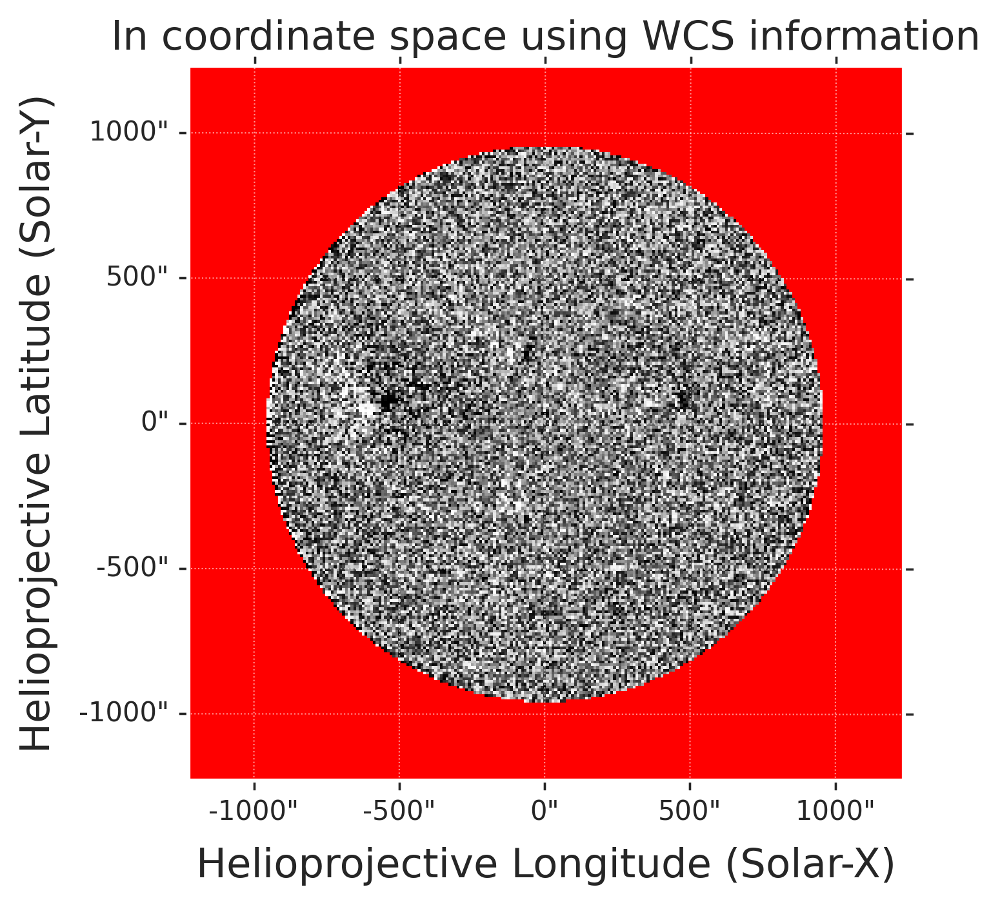
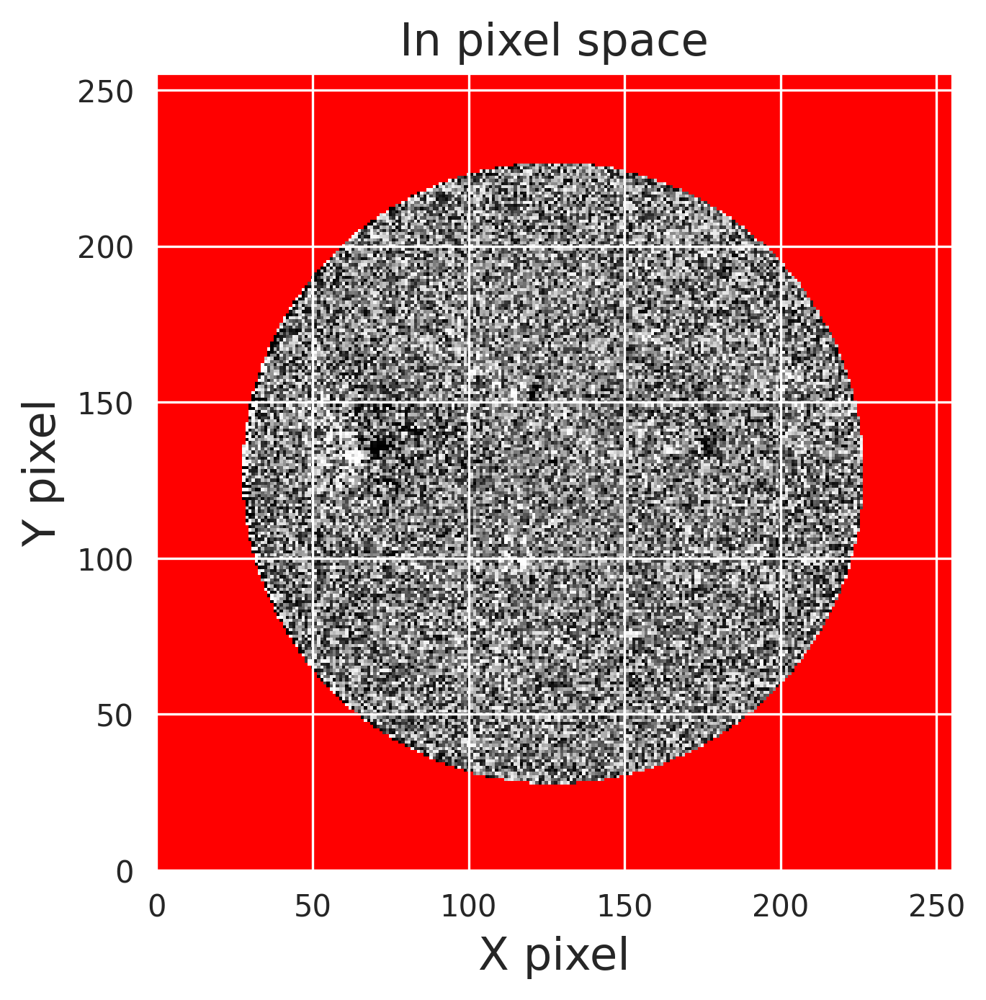
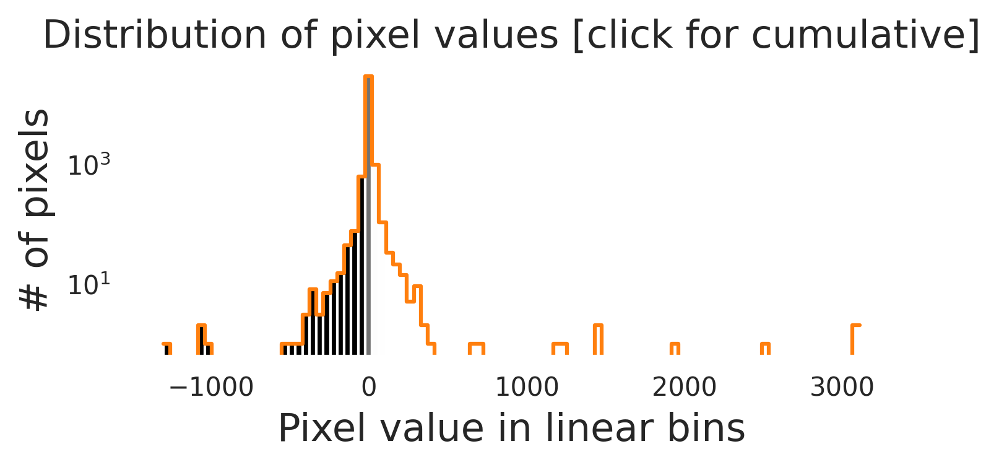
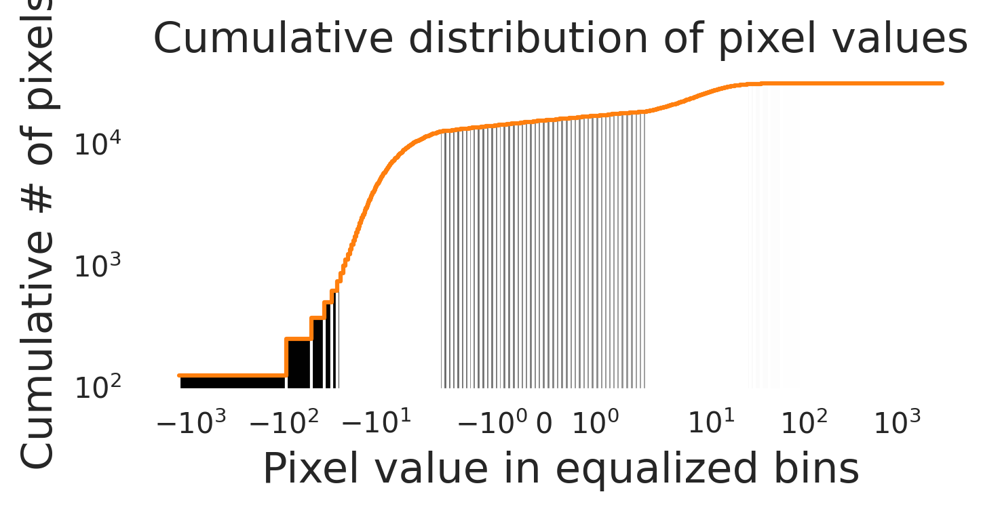

In [3]:
## HMI_magnetogram
# hmiM_example = sunpy.map.Map("data/hmi_magnetogram/2016-10-04T00-01-30.fits")
hmiM_example = sunpy.map.Map("data/hmi_magnetogram/2016-09-30T03-01-30.fits")
hmiM_example

Observatory,SDO
Instrument,AIA 2
Detector,AIA
Measurement,193.0 Angstrom
Wavelength,193.0 Angstrom
Observation Date,2016-09-30 00:00:05
Exposure Time,2.000081 s
Dimension,[256. 256.] pix
Coordinate System,helioprojective
Scale,[9.611424 9.611424] arcsec / pix
Reference Pixel,[127.15937806 127.265625 ] pix

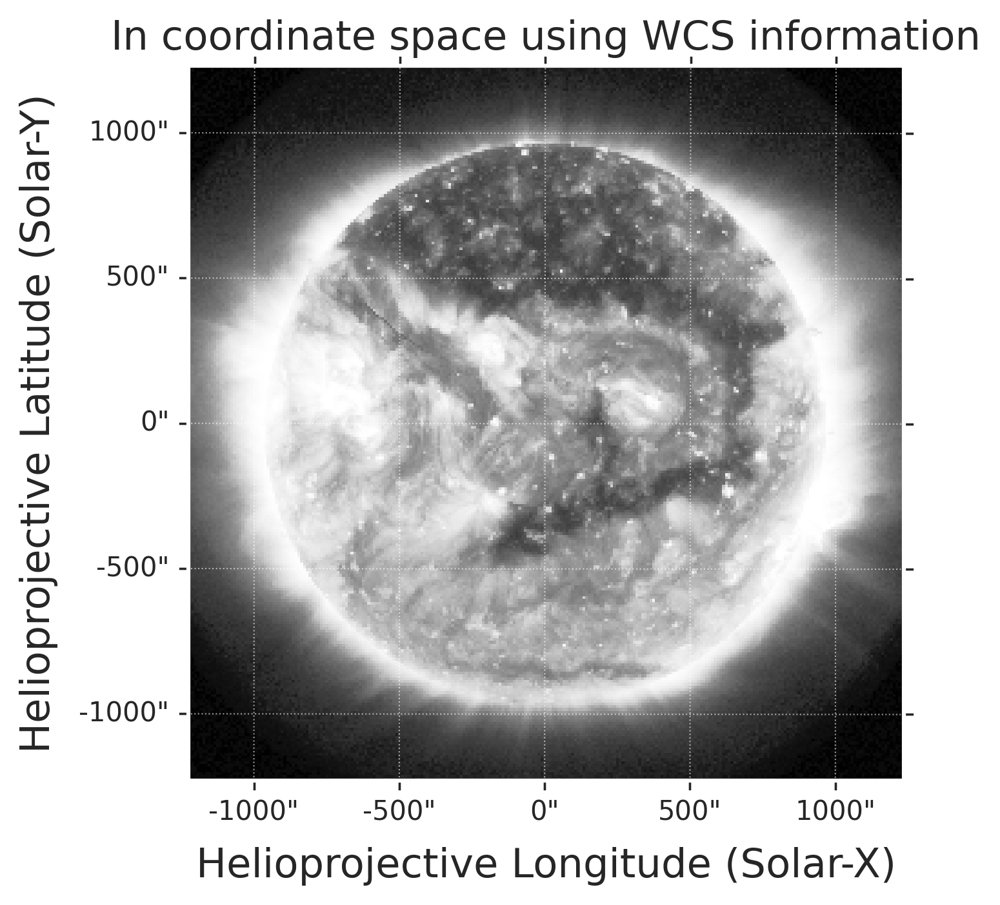
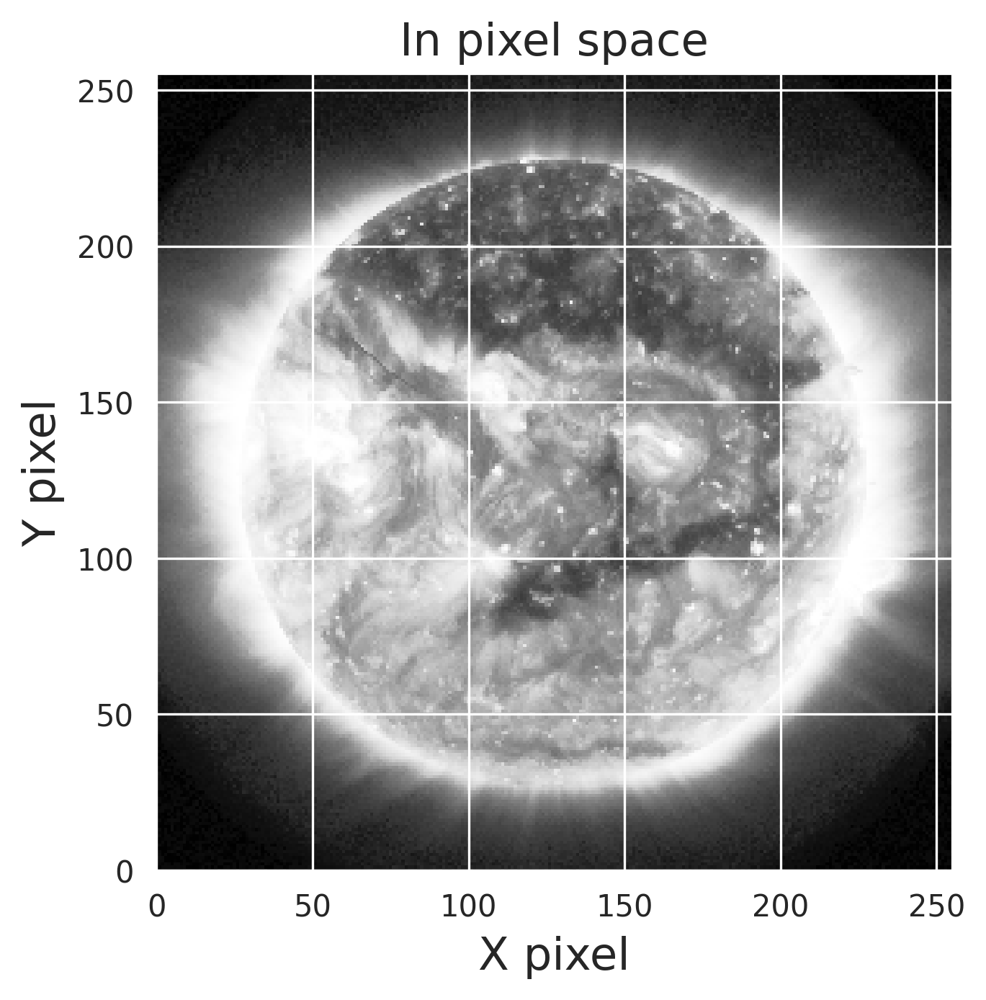
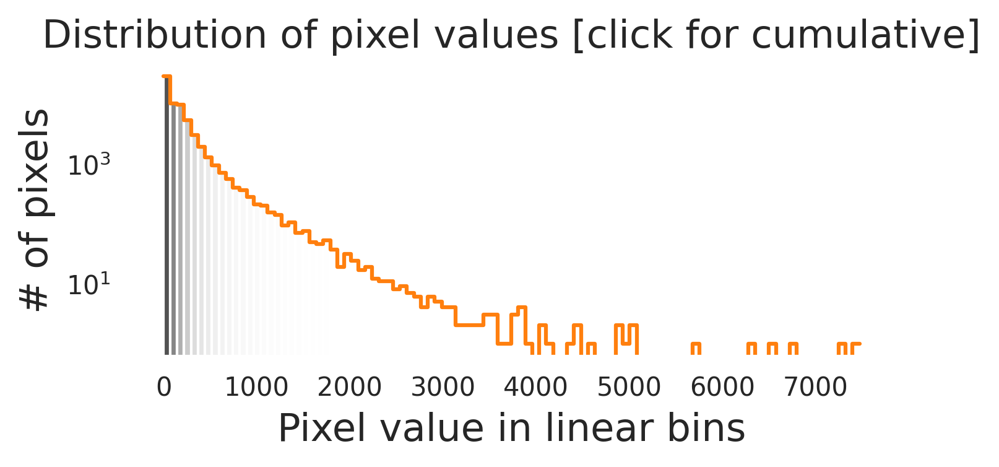
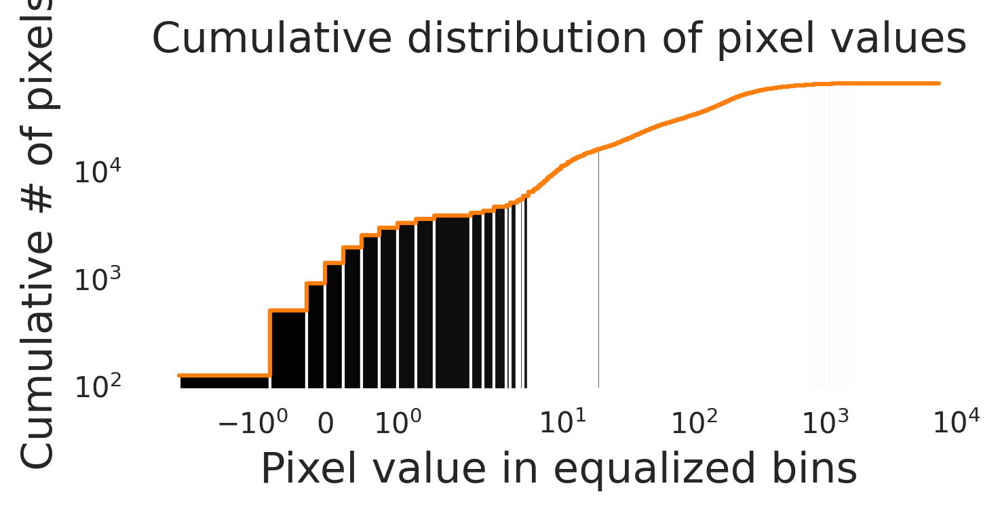

In [4]:
aia193_example = sunpy.map.Map("data/aia_193A/2016-10-04T01-30-07.fits")
aia193_example

Observatory,SDO
Instrument,AIA 2
Detector,AIA
Measurement,211.0 Angstrom
Wavelength,211.0 Angstrom
Observation Date,2016-09-30 00:00:10
Exposure Time,2.900797 s
Dimension,[256. 256.] pix
Coordinate System,helioprojective
Scale,[9.612128 9.612128] arcsec / pix
Reference Pixel,[126.75187681 127.21187594] pix

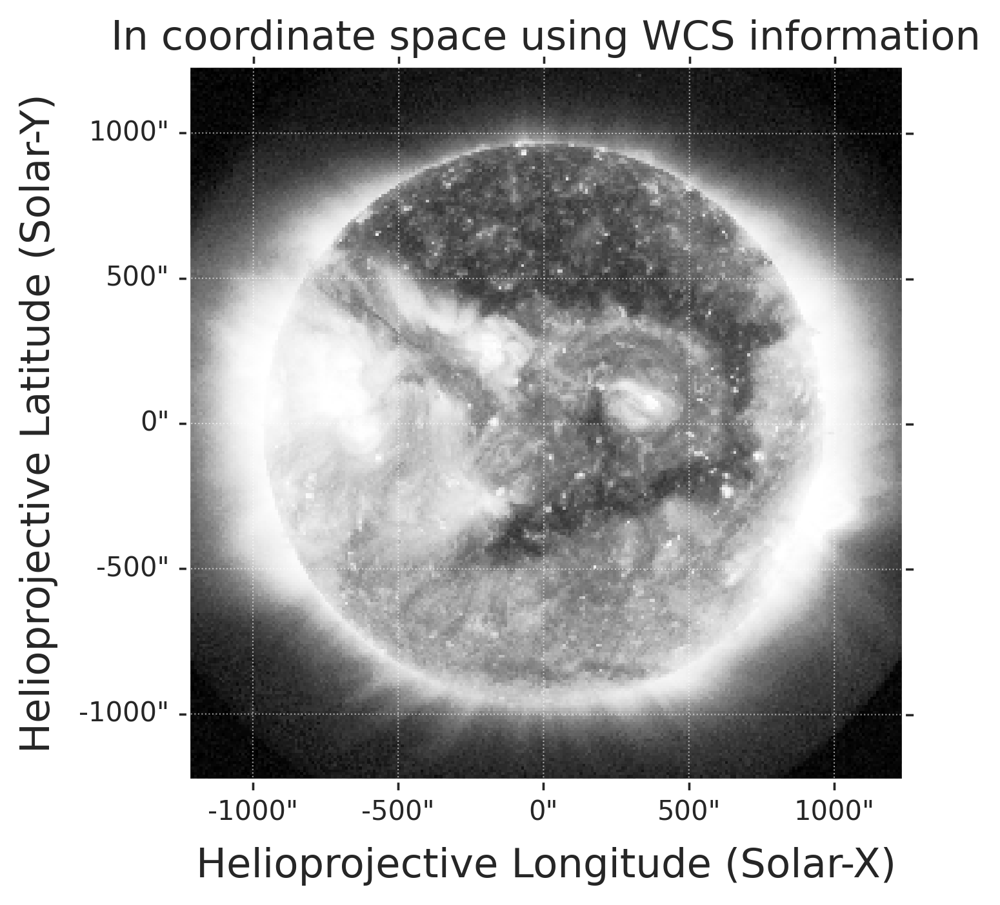
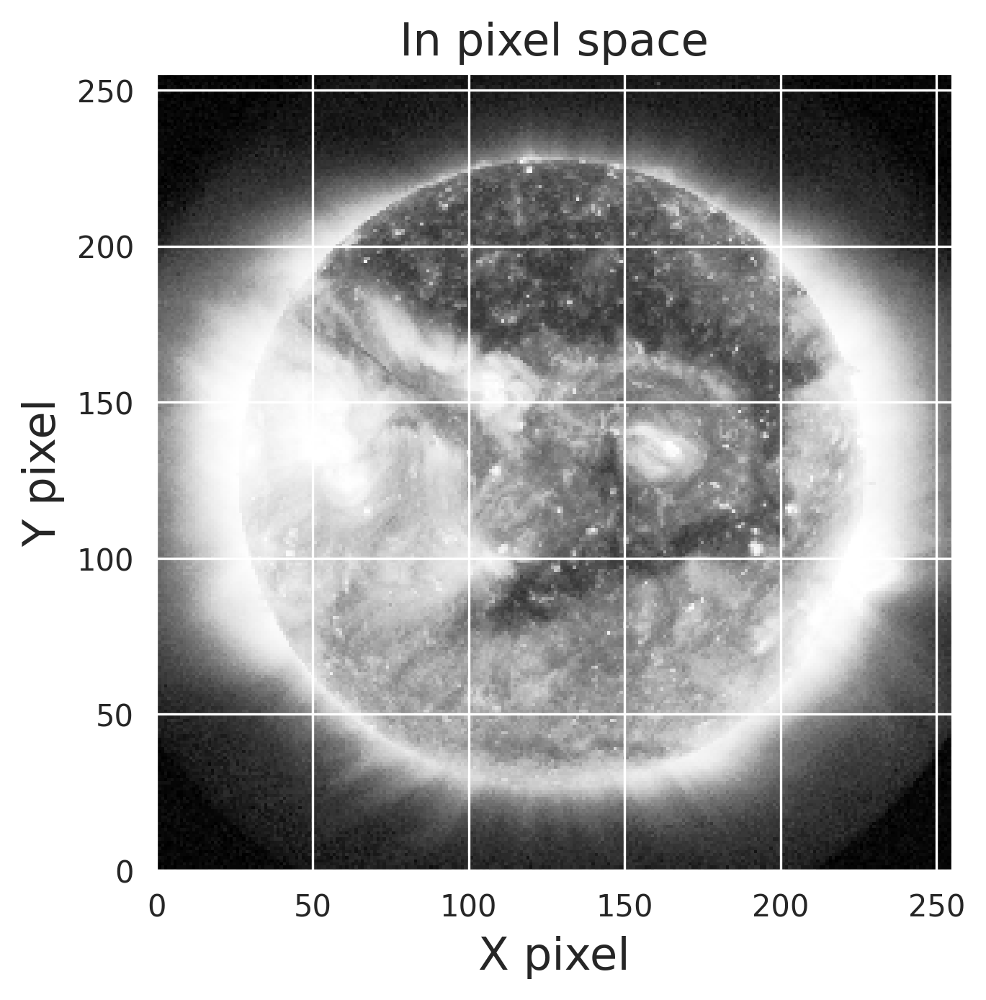
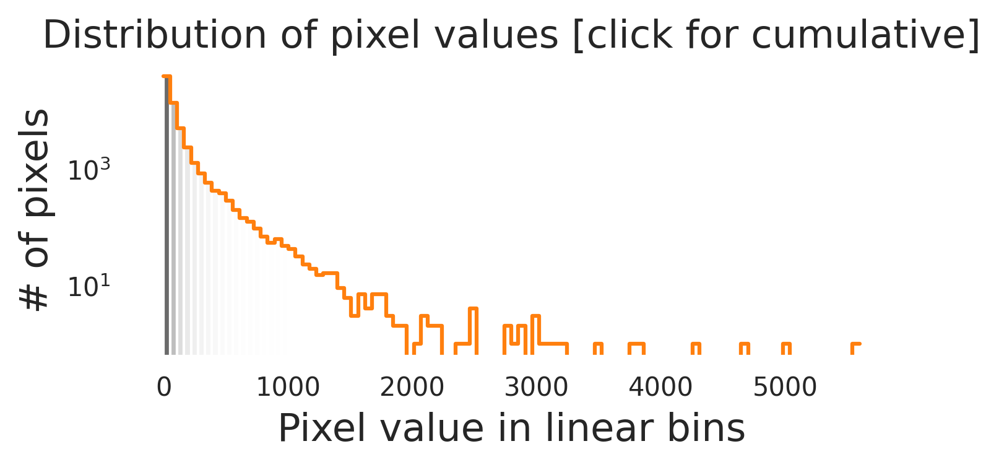
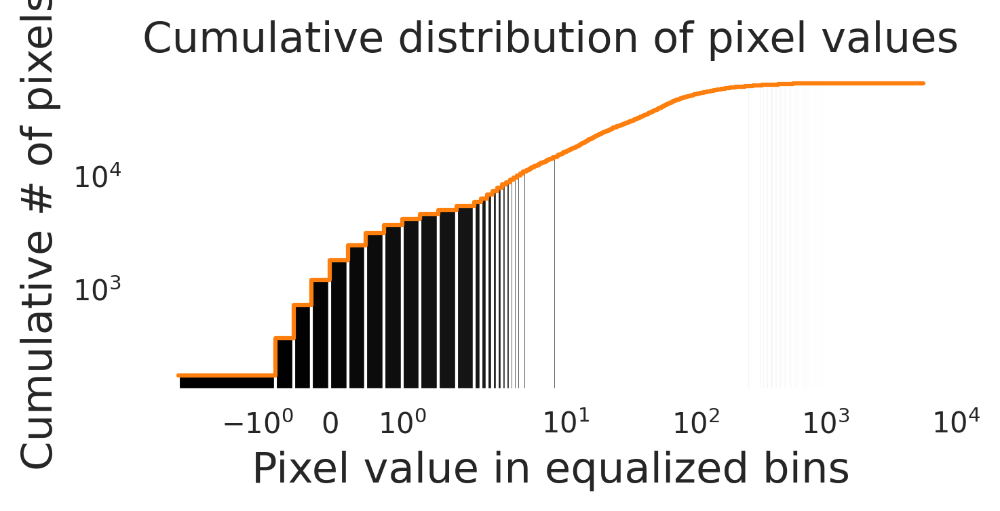

In [5]:
aia211_example = sunpy.map.Map("data/aia_211A/2016-10-04T01-30-13.fits")
aia211_example

Observatory,
Instrument,
Detector,
Measurement,Unknown
Wavelength,Unknown
Observation Date,2016-09-30 00:00:05
Exposure Time,Unknown
Dimension,[256. 256.] pix
Coordinate System,helioprojective
Scale,[0.00266984 0.00266984] deg / pix
Reference Pixel,[127.15937806 127.265625 ] pix

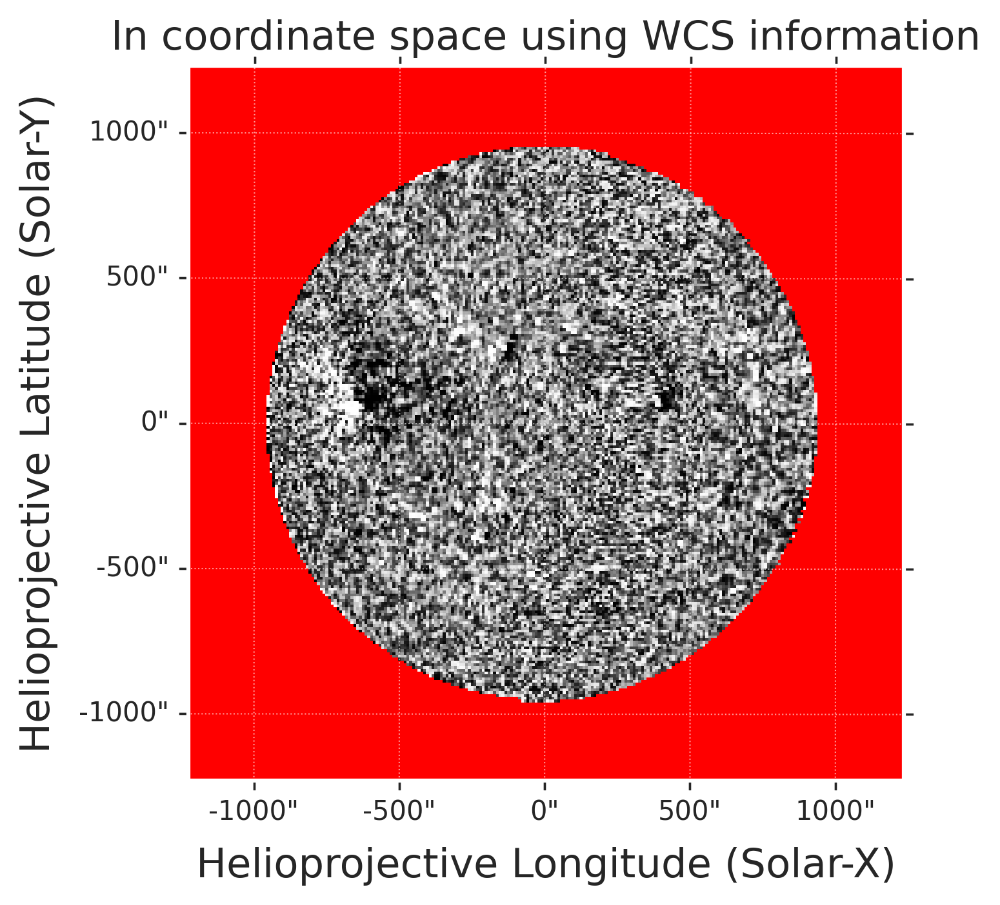
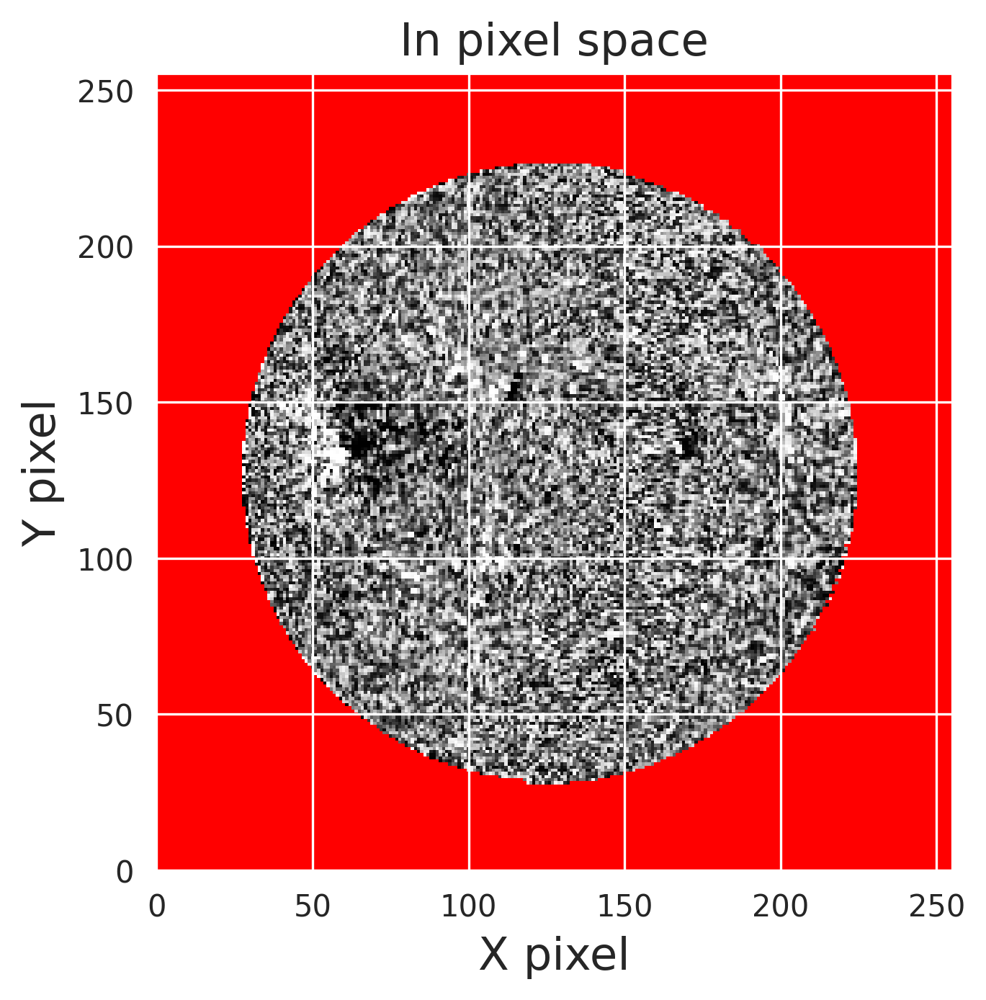
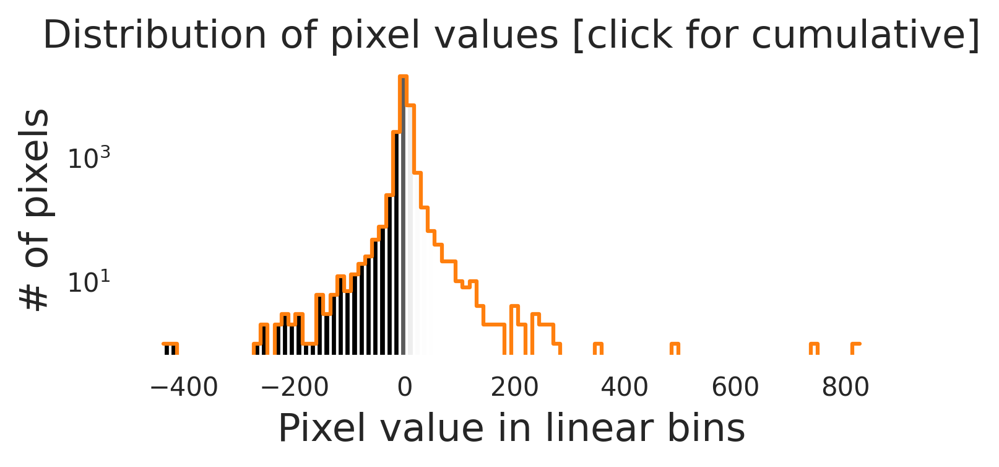
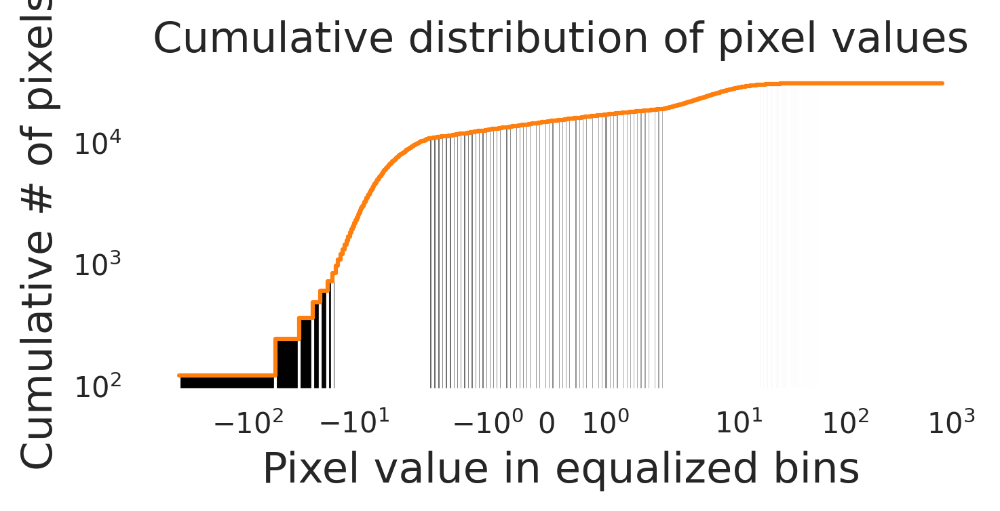

In [6]:
new_hmiM_example = hmiM_example.reproject_to(aia193_example.wcs)
new_hmiM_example

Observatory,
Instrument,
Detector,
Measurement,Unknown
Wavelength,Unknown
Observation Date,2016-09-30 00:00:05
Exposure Time,Unknown
Dimension,[256. 256.] pix
Coordinate System,helioprojective
Scale,[0.00266984 0.00266984] deg / pix
Reference Pixel,[127.15937806 127.265625 ] pix

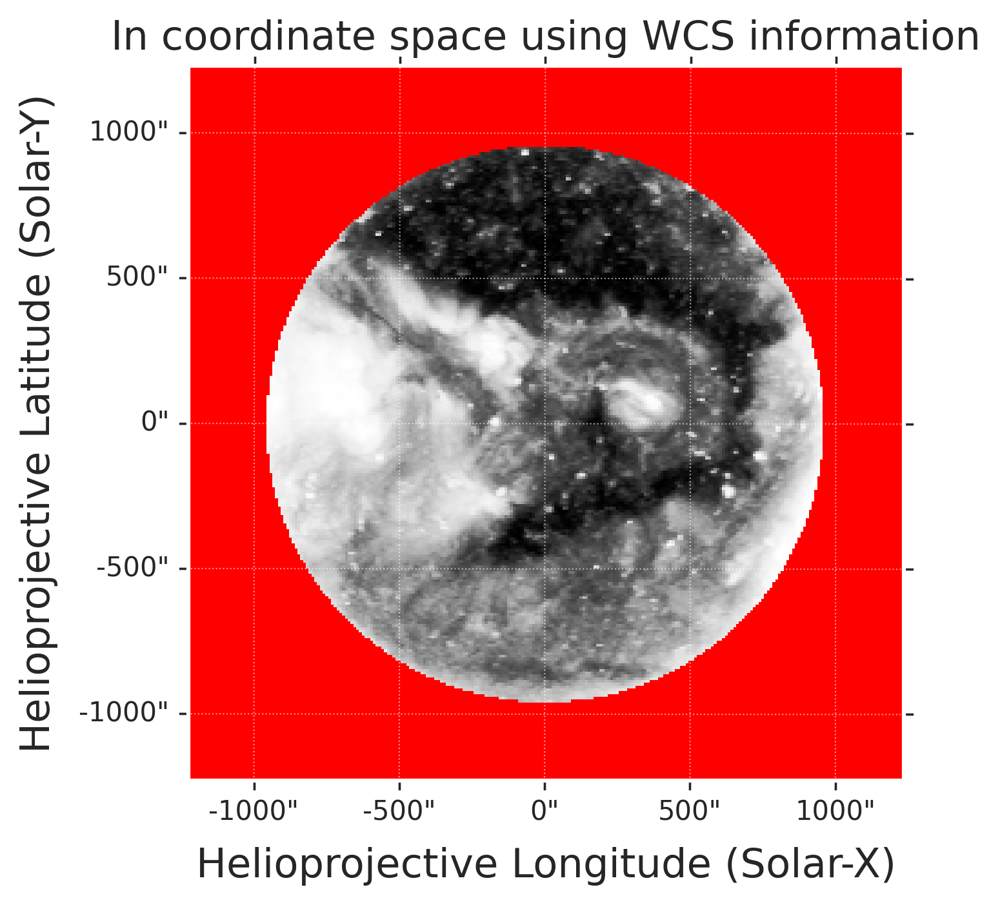
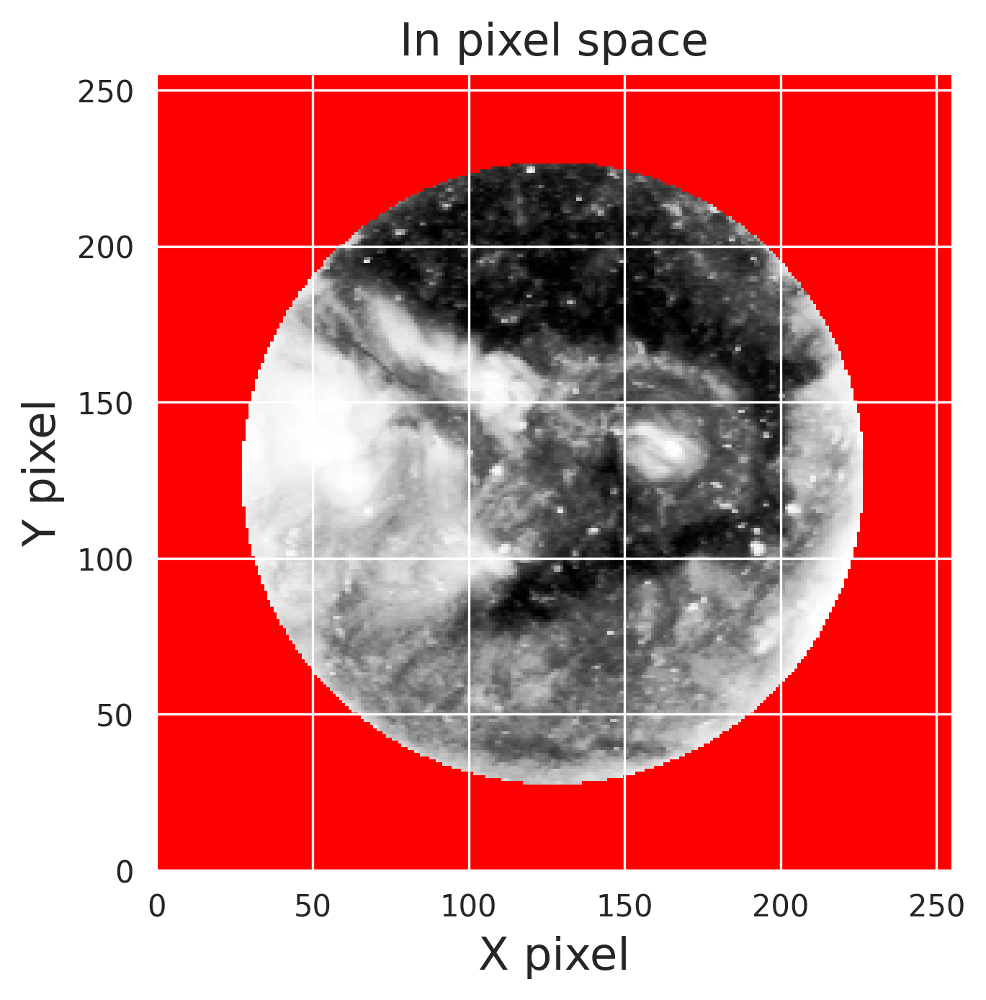
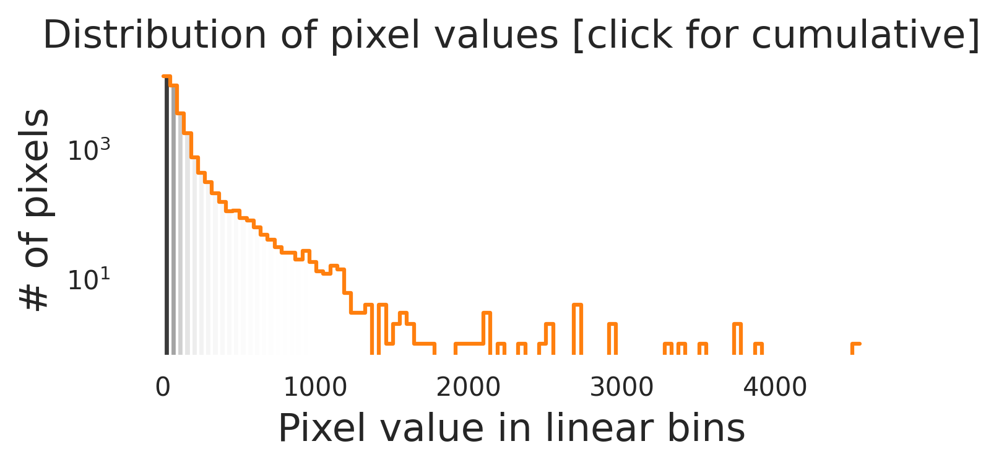
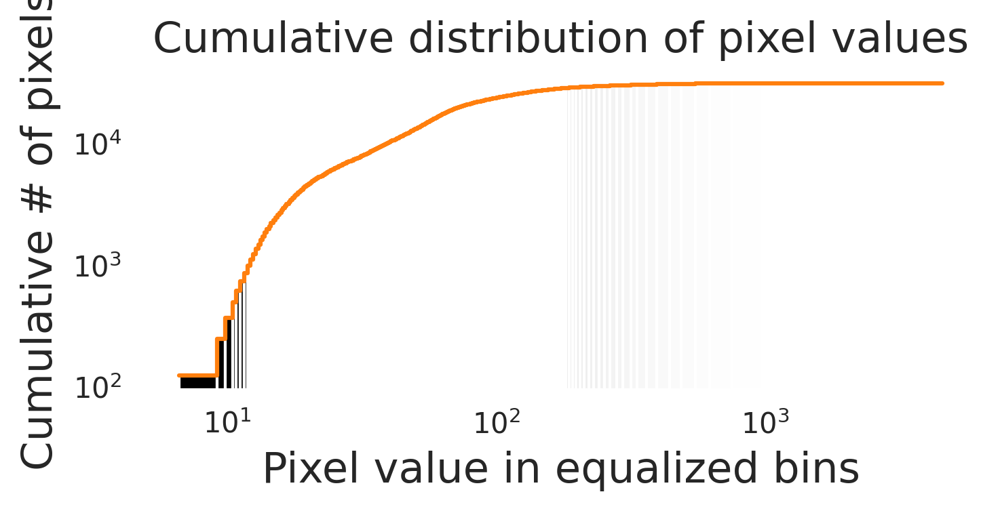

In [7]:
new_aia211_example = aia211_example.reproject_to(aia193_example.wcs)
new_aia211_example

/home/eugeniolr/Documents/master/TFM/data_generator.py:188: RuntimeWarning: All-NaN slice encountered
  min_values = np.nanmin(np.nanmin(data_matrix, axis=2, keepdims=True), axis=1, keepdims=True)
/home/eugeniolr/Documents/master/TFM/data_generator.py:189: RuntimeWarning: All-NaN slice encountered
  max_values = np.nanmax(np.nanmax(data_matrix, axis=2, keepdims=True), axis=1, keepdims=True)
/home/eugeniolr/Documents/master/TFM/data_generator.py:197: RuntimeWarning: All-NaN slice encountered
  hmi_max_values = np.nanmax(np.nanmax(np.abs(data_matrix[:,:,:,2]), axis=2, keepdims=True), axis=1, keepdims=True)


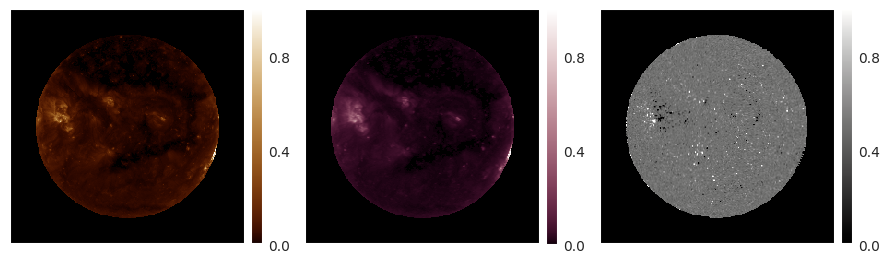

In [8]:
new_aia193_data = aia193_example.data
new_aia193_data[np.isnan(new_aia211_example.data)] = np.nan
composite_data = np.stack([new_aia193_data, new_aia211_example.data, new_hmiM_example.data], axis=2)

composite_data = dg.MultiChannelAEGenerator.normalize(np.asarray([composite_data]))[0]
composite_data[composite_data[:,:,0] == 0, 2] = 0

isns.rgbplot(composite_data, cmap=["sdoaia193", "sdoaia211", "gray"])

From Helioviewer, 2016-09-30 00:00:47


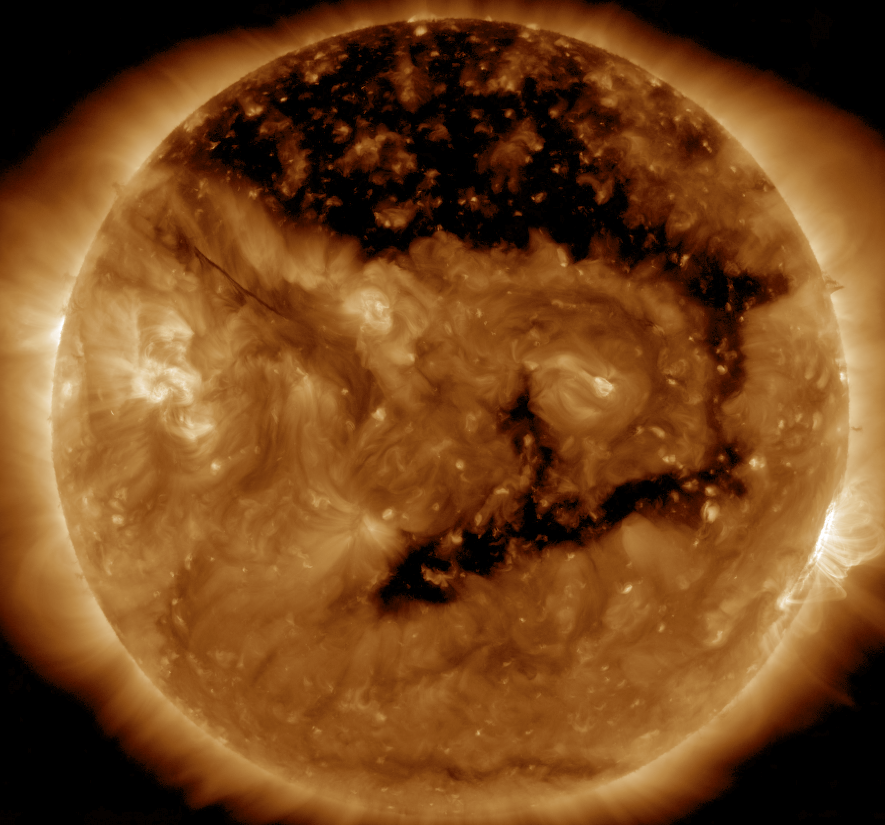

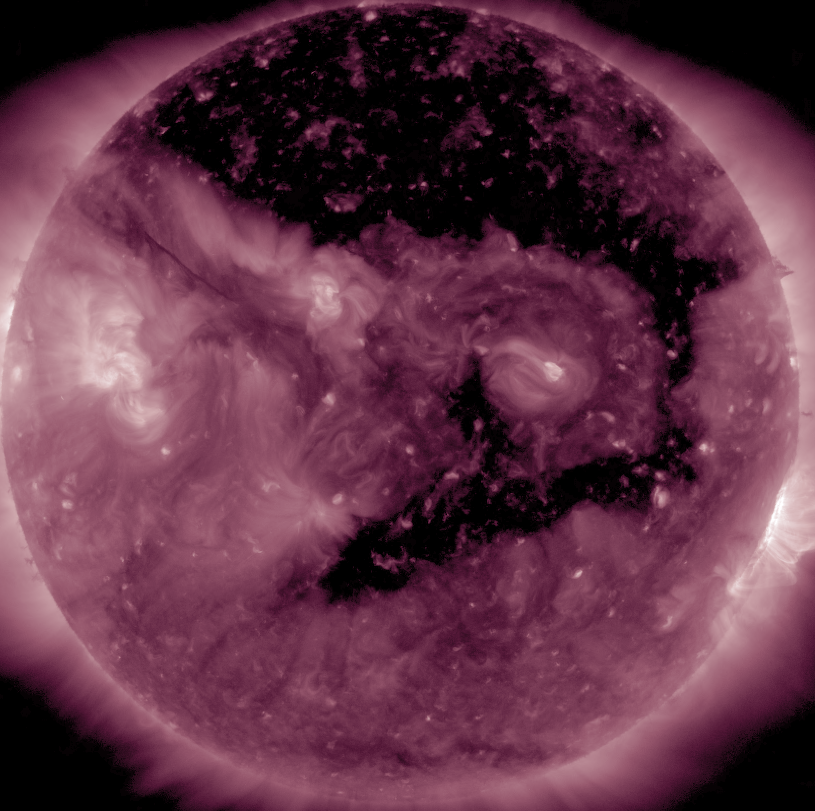

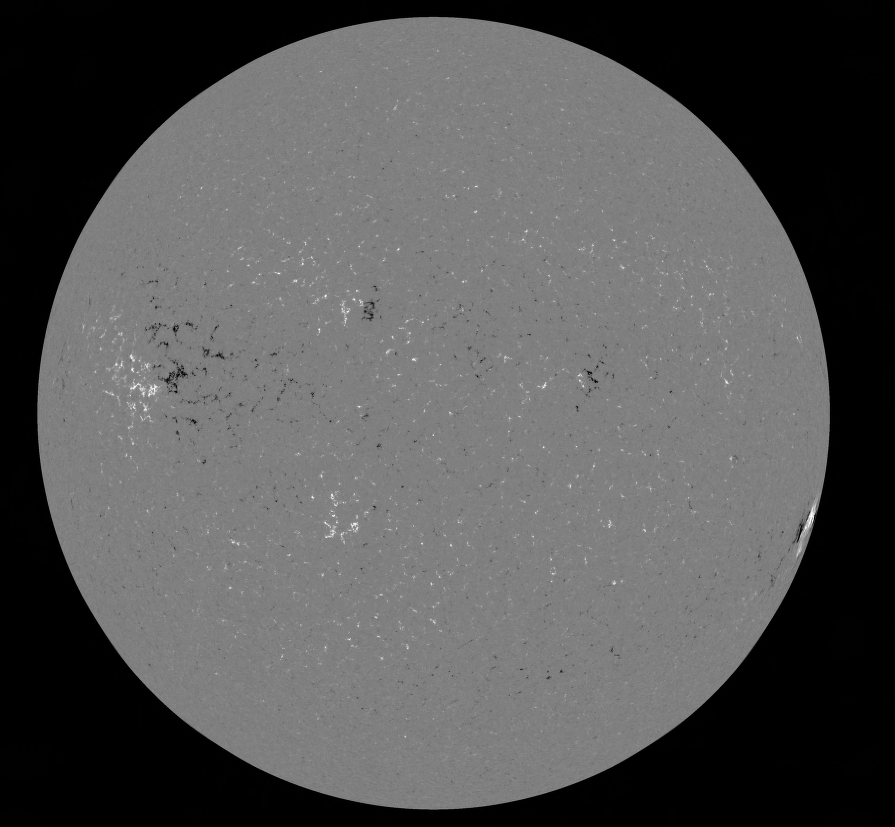

In [9]:
print("From Helioviewer, 2016-09-30 00:00:47")
display(Image(filename='notebook_images/AIA193_example_helioviewer.png', width=256))
display(Image(filename='notebook_images/AIA211_example_helioviewer.png', width=256))
display(Image(filename='notebook_images/HMI_example_helioviewer.png', width=256))

In [10]:
hmi_date_offset = datetime.timedelta(days=4)

## We take as a reference AIA193A and project the rest to it

In [11]:
corrupt_idx = [8197, 10021, 20118, 21086, 22198, 23608]
bad_idx = [998, 2790, 2843, 3715, 4203, 4429]

date_assoc = []

if not os.path.exists("data/composite_data_polar"):
    os.makedirs("data/composite_data_polar")

for aia193_idx, aia193_ref_file in enumerate(aia193_files):
    hmiM_date_dist = [abs(aia193_dates[aia193_idx] - ref_date - hmi_date_offset) for ref_date in hmiM_dates]
    aia211_date_dist = [abs(aia193_dates[aia193_idx] - ref_date) for ref_date in aia211_dates]

    if max(min(hmiM_date_dist), min(aia211_date_dist)) < datetime.timedelta(hours=4) and aia193_idx not in corrupt_idx:
        hmiM_idx = hmiM_date_dist.index(min(hmiM_date_dist))
        aia211_idx = aia211_date_dist.index(min(aia211_date_dist))
        
        date_assoc.append((aia193_ref_file, aia211_files[aia211_idx], hmiM_files[hmiM_idx]))

In [12]:
with open("3channel_assoc.csv", "w") as f:
    f.write("AIA193,AIA211,HMI_m\n")
    for file_names in date_assoc:
        f.write(",".join(file_names))
        f.write("\n")

In [13]:
noise_imgs = []

with open("noisy_193A.csv", "r") as n_aia_f:
    noise_imgs_aia = n_aia_f.readlines()
noise_imgs_aia = [pathlib.Path(i.strip()).stem for i in noise_imgs_aia]


with open("noisy_HMI_m.csv", "r") as n_hmi_f:
    noise_imgs_hmi = n_hmi_f.readlines()

noise_hmi_assoc = []
hmi_assoc = [pathlib.Path(j[2].strip()).stem for j in date_assoc]
print(hmi_assoc[:10])
for i in noise_imgs_hmi:
    hmi_file = pathlib.Path(i.strip()).stem
    if hmi_file in hmi_assoc:
        target_idx = hmi_assoc.index(hmi_file)
        noise_hmi_assoc.append(date_assoc[target_idx][0])

noise_imgs += noise_imgs_aia
noise_imgs += noise_hmi_assoc
print(len(noise_imgs_aia), len(noise_hmi_assoc))


with open("noisy_3channel.csv", "w") as n_3c_f:
    for i in noise_imgs:
        n_3c_f.write(f"data/composite_data/{i}.npy")
        n_3c_f.write("\n")    

['2019-11-24T06-01-30', '2019-10-27T06-01-30', '2016-01-28T03-01-30', '2018-11-14T09-01-30', '2015-06-17T06-01-30', '2015-11-24T06-01-30', '2016-04-14T03-01-30', '2019-11-11T12-01-30', '2020-03-17T09-01-30', '2012-12-02T21-01-30']
3190 34


In [74]:
corrupt_idx = [8197, 10021, 20118, 21086, 22198, 23608]
bad_idx = [998, 2790, 2843, 3715, 4203, 4429]

if not os.path.exists("data/composite_data_polar"):
    os.makedirs("data/composite_data_polar")

for aia193_idx, aia193_ref_file in enumerate(aia193_files):
    new_file_name = aia193_ref_file.replace('.fits', '.npy')

    if os.path.exists(f"data/composite_data_polar/{new_file_name}"):
        print(f"file \"data/composite_data_polar/{new_file_name}\" already exists")
        continue
    
    hmiM_date_dist = [abs(aia193_dates[aia193_idx] - ref_date - hmi_date_offset) for ref_date in hmiM_dates]
    aia211_date_dist = [abs(aia193_dates[aia193_idx] - ref_date) for ref_date in aia211_dates]

    if max(min(hmiM_date_dist), min(aia211_date_dist)) < datetime.timedelta(hours=4) and aia193_idx not in corrupt_idx:
        print(aia193_idx)
        hmiM_idx = hmiM_date_dist.index(min(hmiM_date_dist))
        aia211_idx = aia211_date_dist.index(min(aia211_date_dist))


        aia193_map = sunpy.map.Map("data/aia_193A/" + aia193_ref_file)
        aia211_map = sunpy.map.Map("data/aia_211A/" + aia211_files[aia211_idx])
        hmiM_map = sunpy.map.Map("data/hmi_magnetogram/" + hmiM_files[hmiM_idx])


        new_hmiM_map = hmiM_map.reproject_to(aia193_map.wcs)
        new_aia211_map = aia211_map.reproject_to(aia193_map.wcs)

        polar_aia193 = utils.sunpy_map_to_polar(aia193_map)
        polar_aia211 = utils.sunpy_map_to_polar(new_aia211_map)
        polar_hmiM = utils.sunpy_map_to_polar(new_hmiM_map)

        composite_data = np.stack([polar_aia193, polar_aia211, polar_hmiM], axis=2)
        
        np.save(f"data/composite_data_polar/{new_file_name}", composite_data)
        print(f"Saved tensor of size {composite_data.shape} to \"data/composite_data_polar/{new_file_name}\"")

file "data/composite_data_polar/2019-11-28T04-53-27.npy" already exists
file "data/composite_data_polar/2019-10-31T05-22-26.npy" already exists
file "data/composite_data_polar/2016-02-01T03-34-35.npy" already exists
file "data/composite_data_polar/2018-11-18T08-45-01.npy" already exists
file "data/composite_data_polar/2015-06-21T05-47-23.npy" already exists
file "data/composite_data_polar/2015-11-28T04-43-04.npy" already exists
file "data/composite_data_polar/2016-04-18T03-41-02.npy" already exists
file "data/composite_data_polar/2019-11-15T11-52-18.npy" already exists
file "data/composite_data_polar/2020-03-21T09-07-54.npy" already exists
file "data/composite_data_polar/2012-12-06T22-11-00.npy" already exists
file "data/composite_data_polar/2017-05-11T04-41-28.npy" already exists
file "data/composite_data_polar/2013-10-06T05-14-47.npy" already exists
file "data/composite_data_polar/2019-04-01T09-32-08.npy" already exists
file "data/composite_data_polar/2015-02-08T09-15-00.npy" already

In [75]:
corrupt_idx = [8197, 10021, 20118, 21086, 22198, 23608]
bad_idx = [998, 2790, 2843, 3715, 4203, 4429]

if not os.path.exists("data/composite_data"):
    os.makedirs("data/composite_data")

for aia193_idx, aia193_ref_file in enumerate(aia193_files):
    new_file_name = aia193_ref_file.replace('.fits', '.npy')

    if os.path.exists(f"data/composite_data/{new_file_name}"):
        print(f"file \"data/composite_data/{new_file_name}\" already exists")
        continue
    
    hmiM_date_dist = [abs(aia193_dates[aia193_idx] - ref_date - hmi_date_offset) for ref_date in hmiM_dates]
    aia211_date_dist = [abs(aia193_dates[aia193_idx] - ref_date) for ref_date in aia211_dates]

    if max(min(hmiM_date_dist), min(aia211_date_dist)) < datetime.timedelta(hours=2) and aia193_idx not in corrupt_idx:
        print(aia193_idx)
        hmiM_idx = hmiM_date_dist.index(min(hmiM_date_dist))
        aia211_idx = aia211_date_dist.index(min(aia211_date_dist))


        aia193_map = sunpy.map.Map("data/aia_193A/" + aia193_ref_file)
        aia211_map = sunpy.map.Map("data/aia_211A/" + aia211_files[aia211_idx])
        hmiM_map = sunpy.map.Map("data/hmi_magnetogram/" + hmiM_files[hmiM_idx])

        new_hmiM_map = hmiM_map.reproject_to(aia193_map.wcs)
        new_aia211_map = aia211_map.reproject_to(aia193_map.wcs)
        
        new_hmiM_data = new_hmiM_map.data
        new_aia211_data = new_aia211_map.data
        new_aia193_data = aia193_map.data
        new_aia193_data[np.isnan(new_aia211_data)] = float('NaN')

        composite_data = np.stack([new_aia193_data, new_aia211_data, new_hmiM_data], axis=2)
        
        np.save(f"data/composite_data/{new_file_name}", composite_data)
        print(f"Saved tensor of size {composite_data.shape} to \"data/composite_data/{new_file_name}\"")

file "data/composite_data/2019-11-28T04-53-27.npy" already exists
file "data/composite_data/2019-10-31T05-22-26.npy" already exists
file "data/composite_data/2016-02-01T03-34-35.npy" already exists
file "data/composite_data/2018-11-18T08-45-01.npy" already exists
file "data/composite_data/2015-06-21T05-47-23.npy" already exists
file "data/composite_data/2015-11-28T04-43-04.npy" already exists
file "data/composite_data/2016-04-18T03-41-02.npy" already exists
file "data/composite_data/2019-11-15T11-52-18.npy" already exists
file "data/composite_data/2012-12-06T22-11-00.npy" already exists
file "data/composite_data/2017-05-11T04-41-28.npy" already exists
file "data/composite_data/2013-10-06T05-14-47.npy" already exists
file "data/composite_data/2019-04-01T09-32-08.npy" already exists
file "data/composite_data/2015-02-08T09-15-00.npy" already exists
file "data/composite_data/2018-08-13T06-41-34.npy" already exists
file "data/composite_data/2017-06-29T04-48-44.npy" already exists
file "data